In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
from fbprophet import Prophet
from fbprophet.diagnostics import cross_validation
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()
from datetime import date, datetime
import holidays
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy import stats
import psychrolib
psychrolib.SetUnitSystem(psychrolib.IP)
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer

In [2]:
data = pd.read_csv('data/processed/data_clean.csv')

In [3]:
data['datetime_beginning_utc'] = pd.to_datetime(data['datetime_beginning_utc'])
data['datetime_beginning_ept'] = pd.to_datetime(data['datetime_beginning_ept'])

In [4]:
data.tail()

,datetime_beginning_utc,datetime_beginning_ept,system_energy_price_rt,total_lmp_rt,congestion_price_rt,marginal_loss_price_rt,system_energy_price_da,total_lmp_da,congestion_price_da,marginal_loss_price_da,pepco_mw,midatl_mw,midatl_forecast_load_mw,bcpep_flow_mw,bcpep_limit_mw,total_outages_mw,planned_outages_mw,maintenance_outages_mw,forced_outages_mw,precipIntensity,precipProbability,precipType,temperature,apparentTemperature,dewPoint,humidity,pressure,windSpeed,windGust,cloudCover,uvIndex,visibility,sunniness
39336,2019-11-21 00:00:00,2019-11-20 19:00:00,22.66,24.244510,0.955136,0.631041,32.25,37.603160,5.064800,0.288360,3058.263,33498.709,33966,3291,5600,29219.0,16481.0,10379.0,2359.0,0.0,0.0,none,49.97,47.72,33.59,0.53,1021.9,5.84,6.79,0.90,0.0,5.984,0.0
39337,2019-11-21 01:00:00,2019-11-20 20:00:00,23.98,24.658104,0.006310,0.672627,31.85,37.131499,4.987413,0.294086,2971.795,32658.387,32979,3096,5600,29219.0,16481.0,10379.0,2359.0,0.0,0.0,none,50.00,50.00,33.51,0.53,1022.5,4.79,7.05,1.00,0.0,6.128,0.0
39338,2019-11-21 02:00:00,2019-11-20 21:00:00,24.23,24.220312,-0.676727,0.667872,25.88,29.152662,3.082246,0.190416,2829.161,31248.858,31511,3187,5600,29219.0,16481.0,10379.0,2359.0,0.0,0.0,none,49.02,46.49,32.91,0.54,1023.0,6.03,8.40,0.89,0.0,6.096,0.0
39339,2019-11-21 03:00:00,2019-11-20 22:00:00,20.14,21.625209,0.906794,0.579248,23.53,25.994099,2.257015,0.207084,2650.363,29184.714,29481,3521,5600,29219.0,16481.0,10379.0,2359.0,0.0,0.0,none,48.14,45.24,31.96,0.53,1023.3,6.41,8.46,0.44,0.0,5.685,0.0
39340,2019-11-21 04:00:00,2019-11-20 23:00:00,20.01,21.993846,1.293597,0.686916,22.80,24.651011,1.802089,0.048922,2487.477,27440.844,27716,3451,5000,29219.0,16481.0,10379.0,2359.0,0.0,0.0,none,46.89,44.58,32.28,0.57,1023.2,4.99,6.41,0.15,0.0,6.308,0.0


In [5]:
# creating a feature that is the spread between the BC/PEP interface flow and its limit
data['bcpep_spread_mw'] = data['bcpep_limit_mw'] - data['bcpep_flow_mw']

In [6]:
# calculating enthalpy (measure of total energy) of the air
# converting pressure to psi to comply with psychrolib requirements
data['pressure'] = data['pressure'] * 0.0145038

In [7]:
# calculating intermediate metric of Humidity Ratio
data['humidity_ratio'] = data[['dewPoint', 'pressure']].apply(lambda x: 
                                                              psychrolib.GetHumRatioFromTDewPoint(x['dewPoint'],
                                                                                                  x['pressure']),
                                                              axis=1)


In [8]:
# calculating the enthalpy
data['enthalpy'] = data[['temperature', 'humidity_ratio']].apply(lambda x:
                                                                 psychrolib.GetMoistAirEnthalpy(x['temperature'],
                                                                                                x['humidity_ratio']),
                                                                 axis=1)

In [9]:
# calculating degree days for the heating and cooling season
# to decouple the temperature effects in the summer and winter
CDD_BASE_TEMP = 65
HDD_BASE_TEMP = 65

In [10]:
# cooling degree days
data['CDD'] = data['apparentTemperature'].apply(lambda x: max(round((x-CDD_BASE_TEMP)/24,2),0))

In [11]:
# heating degree days
data['HDD'] = data['apparentTemperature'].apply(lambda x: max(round((HDD_BASE_TEMP-x)/24,2),0))

In [12]:
# sum of heating and cooling degree days
data['DD'] = data['CDD']+data['HDD']

In [13]:
data = pd.get_dummies(data)

In [14]:
# peak hour determination function
def is_peak(time_info_row):
    # these are non-weekend holidays that get treated by the grid as a weekend day (i.e. all off peak hours)
    nerc_holidays = [date(2017, 1, 2),
                     date(2017, 5, 29),
                     date(2017, 7, 4),
                     date(2017, 9, 4),
                     date(2017, 11, 23),
                     date(2017, 12, 25),
                     date(2018, 1, 1),
                     date(2018, 5, 28),
                     date(2018, 7, 4),
                     date(2018, 9, 3),
                     date(2018, 11, 22),
                     date(2018, 12, 25),
                     date(2019, 1, 1),
                     date(2019, 5, 27),
                     date(2019, 7, 4),
                     date(2019, 9, 2),
                     date(2019, 11, 28),
                     date(2019, 12, 25),
                     date(2020, 1, 1),
                     date(2020, 5, 25),
                     date(2020, 7, 4),
                     date(2020, 9, 7),
                     date(2020, 11, 26),
                     date(2020, 12, 25)]
    if time_info_row['date'] in nerc_holidays:
        return 0
    elif time_info_row['dayofweek'] >= 5:
        return 0
    elif (time_info_row['hour'] == 23) or (time_info_row['hour'] <= 6):
        return 0
    else:
        return 1

In [15]:
# establishing on/off peak hours
data['date'] = data['datetime_beginning_ept'].dt.date
data['hour'] = data['datetime_beginning_ept'].dt.hour
data['dayofweek'] = data['datetime_beginning_ept'].dt.dayofweek
data['dayofyear'] = data['datetime_beginning_ept'].dt.dayofyear

data['peak_hour'] = data.apply(lambda x: is_peak(x),
                               axis=1)

In [16]:
def encode(data, col):
    """
    creates sin/cos circular time to allow for regression on time metrics,
    for use in linear regression or decision tree models
    """
    max_val = data[col].max()
    data[col + '_sin'] = np.sin(2 * np.pi * data[col]/max_val)
    data[col + '_cos'] = np.cos(2 * np.pi * data[col]/max_val)
    return data

In [17]:
data = encode(data, 'hour')
data = encode(data, 'dayofweek')
data = encode(data, 'dayofyear')

In [18]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39341 entries, 0 to 39340
Data columns (total 53 columns):
datetime_beginning_utc     39341 non-null datetime64[ns]
datetime_beginning_ept     39341 non-null datetime64[ns]
system_energy_price_rt     39341 non-null float64
total_lmp_rt               39341 non-null float64
congestion_price_rt        39341 non-null float64
marginal_loss_price_rt     39341 non-null float64
system_energy_price_da     39341 non-null float64
total_lmp_da               39341 non-null float64
congestion_price_da        39341 non-null float64
marginal_loss_price_da     39341 non-null float64
pepco_mw                   39341 non-null float64
midatl_mw                  39341 non-null float64
midatl_forecast_load_mw    39341 non-null int64
bcpep_flow_mw              39341 non-null int64
bcpep_limit_mw             39341 non-null int64
total_outages_mw           39341 non-null float64
planned_outages_mw         39341 non-null float64
maintenance_outages_mw     39341 

In [19]:
data

,datetime_beginning_utc,datetime_beginning_ept,system_energy_price_rt,total_lmp_rt,congestion_price_rt,marginal_loss_price_rt,system_energy_price_da,total_lmp_da,congestion_price_da,marginal_loss_price_da,pepco_mw,midatl_mw,midatl_forecast_load_mw,bcpep_flow_mw,bcpep_limit_mw,total_outages_mw,planned_outages_mw,maintenance_outages_mw,forced_outages_mw,precipIntensity,precipProbability,temperature,apparentTemperature,dewPoint,humidity,pressure,windSpeed,windGust,cloudCover,uvIndex,visibility,sunniness,bcpep_spread_mw,humidity_ratio,enthalpy,CDD,HDD,DD,precipType_none,precipType_rain,precipType_sleet,precipType_snow,date,hour,dayofweek,dayofyear,peak_hour,hour_sin,hour_cos,dayofweek_sin,dayofweek_cos,dayofyear_sin,dayofyear_cos
0,2015-05-27 00:00:00,2015-05-26 20:00:00,33.97,34.672699,-0.270768,0.973467,43.41,46.914941,2.285645,1.219296,4594.843,41086.020,38652,4725,5600,15001.0,9827.0,3336.0,1838.0,0.0,0.0,81.69,84.40,67.54,0.62,14.796777,1.72,4.21,0.17,0.0,8.405,0.0,875,0.014358,35.360050,0.81,0.00,0.81,1,0,0,0,2015-05-26,20,1,146,1,-7.308360e-01,0.682553,0.866025,0.5,0.593327,-0.804962
1,2015-05-27 01:00:00,2015-05-26 21:00:00,30.10,31.089979,0.186503,0.803476,38.70,41.301906,1.672998,0.928908,4385.802,39629.213,38363,4646,5600,15001.0,9827.0,3336.0,1838.0,0.0,0.0,79.58,81.95,67.46,0.67,14.796777,1.38,2.39,0.18,0.0,8.425,0.0,954,0.014317,34.795831,0.71,0.00,0.71,1,0,0,0,2015-05-26,21,1,146,1,-5.195840e-01,0.854419,0.866025,0.5,0.593327,-0.804962
2,2015-05-27 02:00:00,2015-05-26 22:00:00,25.63,26.524577,0.206474,0.688102,27.10,29.224701,1.680158,0.444543,4010.564,36012.021,33983,4158,5600,15001.0,9827.0,3336.0,1838.0,0.0,0.0,78.08,78.88,67.51,0.70,14.805479,1.39,3.15,0.25,0.0,7.860,0.0,1442,0.014334,34.444546,0.58,0.00,0.58,1,0,0,0,2015-05-26,22,1,146,1,-2.697968e-01,0.962917,0.866025,0.5,0.593327,-0.804962
3,2015-05-27 03:00:00,2015-05-26 23:00:00,23.16,23.878195,0.040000,0.678195,25.47,26.698681,0.763845,0.464836,3614.615,32327.857,30723,3266,5000,15001.0,9827.0,3336.0,1838.0,0.0,0.0,76.97,77.76,67.36,0.72,14.806929,1.09,3.27,0.16,0.0,7.585,0.0,1734,0.014257,34.086638,0.53,0.00,0.53,1,0,0,0,2015-05-26,23,1,146,0,-2.449294e-16,1.000000,0.866025,0.5,0.593327,-0.804962
4,2015-05-27 04:00:00,2015-05-27 00:00:00,20.10,20.678953,0.030000,0.548953,22.81,23.586738,0.321580,0.455158,3295.574,29374.991,29278,3276,6300,15001.0,9827.0,3336.0,1838.0,0.0,0.0,75.63,76.41,67.09,0.75,14.806929,0.93,2.14,0.23,0.0,8.196,0.0,3024,0.014122,33.608461,0.48,0.00,0.48,1,0,0,0,2015-05-27,0,2,147,0,0.000000e+00,1.000000,0.866025,-0.5,0.579421,-0.815028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39336,2019-11-21 00:00:00,2019-11-20 19:00:00,22.66,24.244510,0.955136,0.631041,32.25,37.603160,5.064800,0.288360,3058.263,33498.709,33966,3291,5600,29219.0,16481.0,10379.0,2359.0,0.0,0.0,49.97,47.72,33.59,0.53,14.821433,5.84,6.79,0.90,0.0,5.984,0.0,2309,0.003991,16.315790,0.00,0.72,0.72,1,0,0,0,2019-11-20,19,2,324,1,-8.878852e-01,0.460065,0.866025,-0.5,-0.660152,0.751132
39337,2019-11-21 01:00:00,2019-11-20 20:00:00,23.98,24.658104,0.006310,0.672627,31.85,37.131499,4.987413,0.294086,2971.795,32658.387,32979,3096,5600,29219.0,16481.0,10379.0,2359.0,0.0,0.0,50.00,50.00,33.51,0.53,14.830136,4.79,7.05,1.00,0.0,6.128,0.0,2504,0.003976,16.306573,0.00,0.62,0.62,1,0,0,0,2019-11-20,20,2,324,1,-7.308360e-01,0.682553,0.866025,-0.5,-0.660152,0.751132
39338,2019-11-21 02:00:00,2019-11-20 21:00:00,24.23,24.220312,-0.676727,0.667872,25.88,29.152662,3.082246,0.190416,2829.161,31248.858,31511,3187,5600,29219.0,16481.0,10379.0,2359.0,0.0,0.0,49.02,46.49,32.91,0.54,14.837387,6.03,8.40,0.89,0.0,6.096,0.0,2413,0.003879,15.964507,0.00,0.77,0.77,1,0,0,0,2019-11-20,21,2,324,1,-5.195840e-01,0.854419,0.866025,-0.5,-0.660152,0.751132
39339,2019-11-21 03:00:00,2019-11-20 22:00:00,20.14,21.625209,0.906794,0.579248,23.5

In [20]:
# EDA and scaling will be performed using the 2017-2018 data
train_data = data.loc[data['datetime_beginning_ept'] < pd.Timestamp(2019, 1, 1)].copy()

In [21]:
# standardizing data
cols_to_stdz = ['total_lmp_rt', 'system_energy_price_rt', 'congestion_price_rt',
                'marginal_loss_price_rt', 'total_lmp_da', 'system_energy_price_da',
                'congestion_price_da', 'marginal_loss_price_da', 'pepco_mw',
                'midatl_mw', 'midatl_forecast_load_mw', 'bcpep_limit_mw',
                'bcpep_flow_mw', 'bcpep_spread_mw', 'total_outages_mw',
                'planned_outages_mw', 'maintenance_outages_mw', 'forced_outages_mw',
                'temperature', 'apparentTemperature', 'enthalpy', 'dewPoint',
                'humidity_ratio', 'humidity', 'CDD', 'HDD', 'DD', 'sunniness',
                'uvIndex', 'precipIntensity', 'precipProbability',  'pressure',
                'windSpeed', 'windGust', 'cloudCover', 'visibility']
stdz_cols = [col+'_std' for col in cols_to_stdz]

In [22]:
std_scaler = StandardScaler()
train_data_std = std_scaler.fit_transform(train_data[cols_to_stdz] )

In [23]:
train_data_std = pd.DataFrame(train_data_std, columns=cols_to_stdz)

In [24]:
train_data = train_data.merge(train_data_std, how='left', left_index=True, right_index=True, suffixes=('','_std'))

In [25]:
train_data.head(24)

,datetime_beginning_utc,datetime_beginning_ept,system_energy_price_rt,total_lmp_rt,congestion_price_rt,marginal_loss_price_rt,system_energy_price_da,total_lmp_da,congestion_price_da,marginal_loss_price_da,pepco_mw,midatl_mw,midatl_forecast_load_mw,bcpep_flow_mw,bcpep_limit_mw,total_outages_mw,planned_outages_mw,maintenance_outages_mw,forced_outages_mw,precipIntensity,precipProbability,temperature,apparentTemperature,dewPoint,humidity,pressure,windSpeed,windGust,cloudCover,uvIndex,visibility,sunniness,bcpep_spread_mw,humidity_ratio,enthalpy,CDD,HDD,DD,precipType_none,precipType_rain,precipType_sleet,precipType_snow,date,hour,dayofweek,dayofyear,peak_hour,hour_sin,hour_cos,dayofweek_sin,dayofweek_cos,dayofyear_sin,dayofyear_cos,total_lmp_rt_std,system_energy_price_rt_std,congestion_price_rt_std,marginal_loss_price_rt_std,total_lmp_da_std,system_energy_price_da_std,congestion_price_da_std,marginal_loss_price_da_std,pepco_mw_std,midatl_mw_std,midatl_forecast_load_mw_std,bcpep_limit_mw_std,bcpep_flow_mw_std,bcpep_spread_mw_std,total_outages_mw_std,planned_outages_mw_std,maintenance_outages_mw_std,forced_outages_mw_std,temperature_std,apparentTemperature_std,enthalpy_std,dewPoint_std,humidity_ratio_std,humidity_std,CDD_std,HDD_std,DD_std,sunniness_std,uvIndex_std,precipIntensity_std,precipProbability_std,pressure_std,windSpeed_std,windGust_std,cloudCover_std,visibility_std
0,2015-05-27 00:00:00,2015-05-26 20:00:00,33.97,34.672699,-0.270768,0.973467,43.41,46.914941,2.285645,1.219296,4594.843,41086.020,38652,4725,5600,15001.0,9827.0,3336.0,1838.0,0.0000,0.00,81.69,84.40,67.54,0.62,14.796777,1.72,4.21,0.17,0.0,8.405,0.0,875,0.014358,35.360050,0.81,0.0,0.81,1,0,0,0,2015-05-26,20,1,146,1,-7.308360e-01,0.682553,0.866025,0.5,0.593327,-0.804962,0.015806,0.165093,-0.346491,0.382473,0.648141,0.833390,-0.256392,0.930953,2.294428,1.503879,1.112498,0.293266,1.008804,-0.871798,0.059917,0.234727,-0.677309,0.001753,1.249469,1.267224,1.213225,1.025768,1.117399,-0.373582,1.607315,-0.800313,0.268104,-1.031794,-0.606123,-0.165750,-0.309489,0.311161,-0.190356,-0.025818,-0.781453,0.602454
1,2015-05-27 01:00:00,2015-05-26 21:00:00,30.10,31.089979,0.186503,0.803476,38.70,41.301906,1.672998,0.928908,4385.802,39629.213,38363,4646,5600,15001.0,9827.0,3336.0,1838.0,0.0000,0.00,79.58,81.95,67.46,0.67,14.796777,1.38,2.39,0.18,0.0,8.425,0.0,954,0.014317,34.795831,0.71,0.0,0.71,1,0,0,0,2015-05-26,21,1,146,1,-5.195840e-01,0.854419,0.866025,0.5,0.593327,-0.804962,-0.114952,-0.016773,-0.299964,0.182604,0.350060,0.526868,-0.382624,0.472067,1.983094,1.280498,1.066956,0.293266,0.939548,-0.796874,0.059917,0.234727,-0.677309,0.001753,1.130195,1.140572,1.154259,1.021488,1.109466,-0.098502,1.328263,-0.800313,0.060149,-1.031794,-0.606123,-0.165750,-0.309489,0.311161,-0.339931,-0.455435,-0.755161,0.615168
2,2015-05-27 02:00:00,2015-05-26 22:00:00,25.63,26.524577,0.206474,0.688102,27.10,29.224701,1.680158,0.444543,4010.564,36012.021,33983,4158,5600,15001.0,9827.0,3336.0,1838.0,0.0000,0.00,78.08,78.88,67.51,0.70,14.805479,1.39,3.15,0.25,0.0,7.860,0.0,1442,0.014334,34.444546,0.58,0.0,0.58,1,0,0,0,2015-05-26,22,1,146,1,-2.697968e-01,0.962917,0.866025,0.5,0.593327,-0.804962,-0.281575,-0.226836,-0.297932,0.046952,-0.291303,-0.228048,-0.381149,-0.293351,1.424235,0.725852,0.376726,0.293266,0.511742,-0.334049,0.059917,0.234727,-0.677309,0.001753,1.045403,0.981870,1.117546,1.024163,1.112731,0.066546,0.965497,-0.800313,-0.210194,-1.031794,-0.606123,-0.165750,-0.309489,0.393775,-0.335532,-0.276035,-0.571121,0.256001
3,2015-05-27 03:00:00,2015-05-26 23:00:00,23.16,23.878195,0.040000,0.678195,25.47,26.698681,0.763845,0.464836,3614.615,32327.857,30723,3266,5000,15001.0,9827.0,3336.0,1838.0,0.0000,0.00,76.97,77.76,67.36,0.72,14.806929,1.09,3.27,0.16,0.0,7.585,0.0,1734,0.014257,34.086638,0.53,0.0,0.53,1,0,0,0,2015-05-26,23,1,146,0,-2.449294e-16,1.000000,0.866025,0.5,0.593327,-0.804962,-0.378160,-0.342911,-0.314871,0.035304,-0.425447,-0.334126,-0.569949,-0.261283,0.834531,0.160936,-0.137007,-0

In [26]:
plot_df = train_data[['datetime_beginning_utc']+stdz_cols].copy()

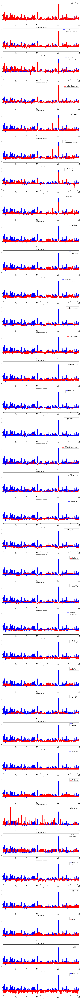

In [27]:
# plotting standardized real time price against other features
pd.plotting.register_matplotlib_converters()
fig, axes = plt.subplots(36, 1, figsize=(15, 200))
for i, col in enumerate(plot_df.columns[1:]):
    plot_df.plot(x='datetime_beginning_utc', y='total_lmp_rt_std',
                 color="b", label='target_rt_lmp', ax=axes[i])
    plot_df.plot(x='datetime_beginning_utc', y=col,
                 color="r", label=col, ax=axes[i])

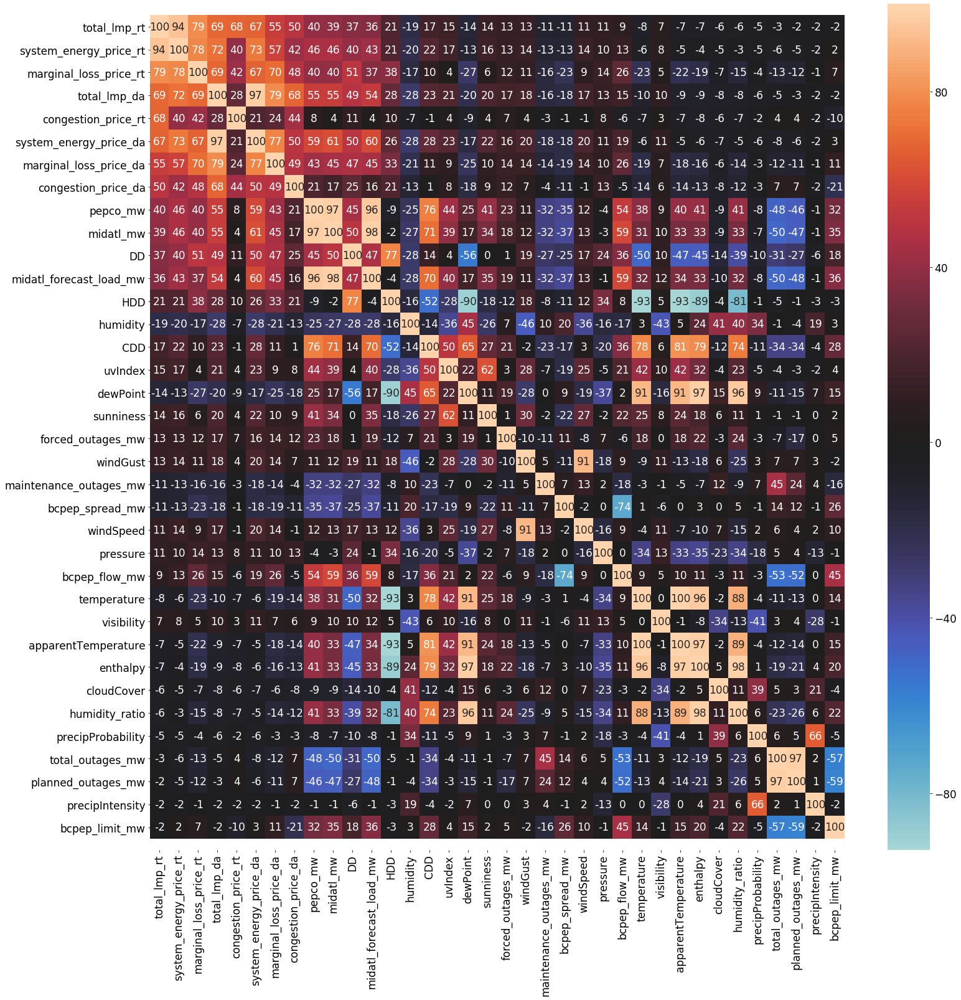

In [28]:
# observing data correlations
# creating the sort order
sorted_corr_series = train_data_std.corr().total_lmp_rt.abs().sort_values(ascending=False)
sorted_cols = list(sorted_corr_series.index)

# to allow for larger font sizes,
# the correlations are being rounded and multiplied by 100
sorted_corr_df = train_data_std[sorted_cols].corr().round(2)*100

plt.rcParams.update({'font.size': 17})
fig, ax = plt.subplots(figsize = (25, 25))

sns.heatmap(sorted_corr_df.astype(int),
           center = 0, annot = True, fmt="d")

# a bug in the current version of matplotlib shifts the default ylim,
# and the code below corrects it
ax.set_ylim(len(train_data_std.columns)+0.5, -0.5);
plt.show;
plt.rcParams.update({'font.size': 10})

In [42]:
temporal = ['datetime_beginning_utc', 'datetime_beginning_ept']
# will consider separately forecasting each component of the price
price_targets = ['total_lmp_rt',
                 'system_energy_price_rt', 'congestion_price_rt', 'marginal_loss_price_rt']
# selected based on domain knowledge and correlation (visual and coefficient)
price_features = ['total_lmp_da', 'system_energy_price_da',
                  'congestion_price_da', 'marginal_loss_price_da', 'pepco_mw',
                  'bcpep_flow_mw', 'bcpep_spread_mw',
                  'maintenance_outages_mw', 'forced_outages_mw',
                  'dewPoint', 'enthalpy', 'apparentTemperature',
                  'DD', 'CDD', 'HDD', 'uvIndex', 'peak_hour']

In [43]:
price_df = data[temporal+price_targets+price_features]

In [31]:
# dropping features that aren't available for longer term (multiple days) load forecasts,
# but are available for shorter term (multiple hours) price forecasts.
short_term_cols = ['total_lmp_rt_std',
                   'system_energy_price_rt_std', 'congestion_price_rt_std',
                   'marginal_loss_price_rt_std', 'total_lmp_da_std',
                   'system_energy_price_da_std', 'congestion_price_da_std',
                   'marginal_loss_price_da_std', 'midatl_mw_std',
                   'midatl_forecast_load_mw_std', 'bcpep_limit_mw_std',
                   'bcpep_flow_mw_std', 'bcpep_spread_mw_std']

mw_plot_df = plot_df.drop(columns=short_term_cols)

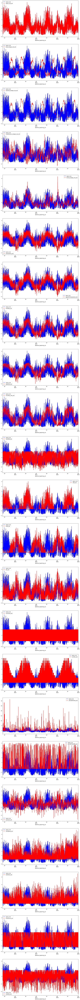

In [32]:
# plotting standardized Pepco MW against other features
pd.plotting.register_matplotlib_converters()
fig, axes = plt.subplots(23, 1, figsize=(15, 200))
for i, col in enumerate(mw_plot_df.columns[1:]):
    mw_plot_df.plot(x='datetime_beginning_utc', y='pepco_mw_std',
                    color="b", label='pepco_mw', ax=axes[i])
    mw_plot_df.plot(x='datetime_beginning_utc', y=col,
                    color="r", label=col, ax=axes[i])

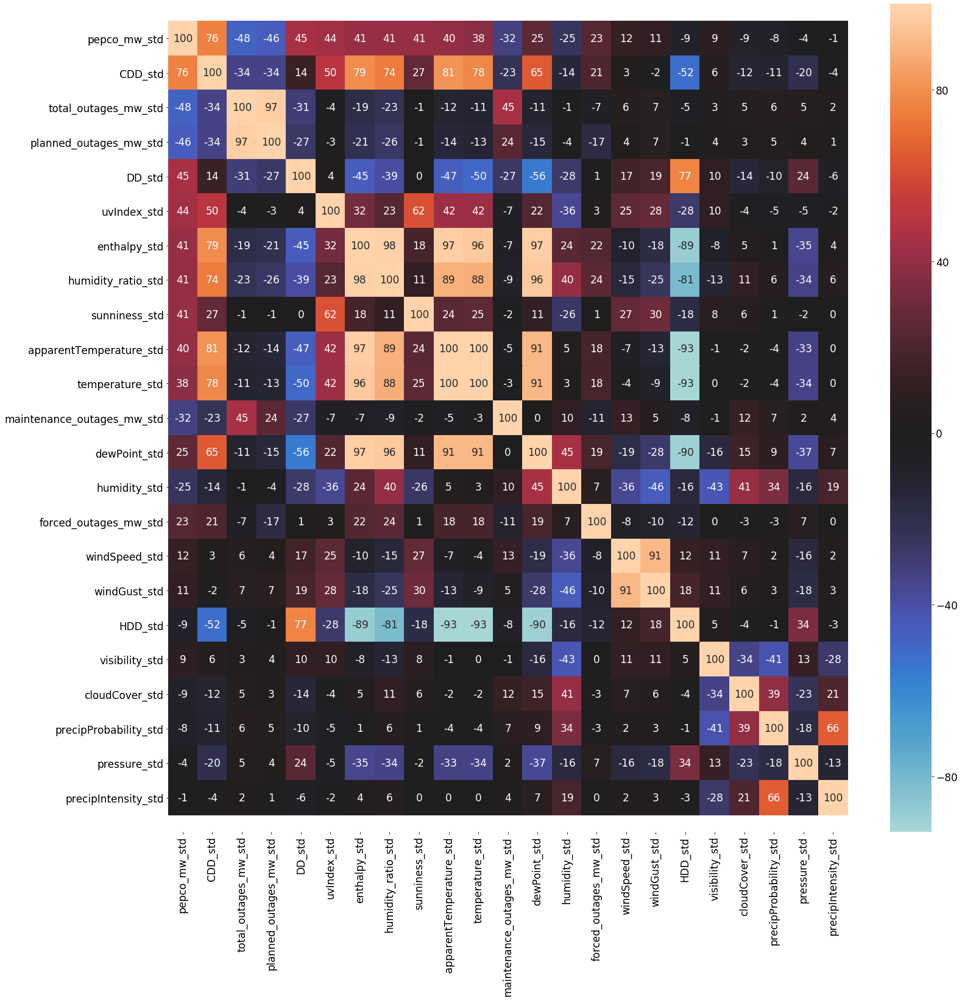

In [33]:
# observing data correlations
# creating the sort order
corr_data = mw_plot_df.drop(columns='datetime_beginning_utc')
sorted_corr_series = corr_data.corr().pepco_mw_std.abs().sort_values(ascending=False)
sorted_cols = list(sorted_corr_series.index)

# to allow for larger font sizes,
# the correlations are being rounded and multiplied by 100
sorted_corr_df = corr_data[sorted_cols].corr().round(2)*100

plt.rcParams.update({'font.size': 17})
fig, ax = plt.subplots(figsize = (25, 25))

sns.heatmap(sorted_corr_df.astype(int),
           center = 0, annot = True, fmt="d")

# a bug in the current version of matplotlib shifts the default ylim,
# and the code below corr_data it
ax.set_ylim(len(corr_data.columns)+0.5, -0.5);
plt.show;
plt.rcParams.update({'font.size': 10})

In [44]:
temporal = ['datetime_beginning_utc', 'datetime_beginning_ept']
mw_targets = ['pepco_mw']
# selected based on domain knowledge and correlation (visual and coefficient)
mw_features = ['total_outages_mw', 'planned_outages_mw',
               'maintenance_outages_mw', 'forced_outages_mw',
               'enthalpy', 'apparentTemperature', 'dewPoint',
               'DD', 'CDD', 'HDD', 'uvIndex', 'peak_hour']

In [45]:
mw_df = data[temporal+mw_targets+mw_features]

In [48]:
price_df.to_csv('data/processed/price_data.csv', index=False)

In [49]:
mw_df.to_csv('data/processed/mw_data.csv', index=False)

In [63]:
data_test = data.loc[(data['datetime_beginning_utc'] >= datetime(2019, 11, 2)) & (data['datetime_beginning_utc'] < (datetime(2019, 11, 3)))]
data_test

In [22]:
df = data[['datetime_beginning_utc', 'total_lmp_rt', 'system_energy_price_da',
           'congestion_price_da', 'marginal_loss_price_da',
           'pepco_mw', 'HDD', 'CDD', 'bcpep_spread_mw',
           'forced_outages_mw']].copy()
df.rename(columns={'datetime_beginning_utc': 'ds', 'total_lmp_rt': 'y'}, inplace=True)

In [23]:
df_train = df.loc[df['ds'] < datetime(2019, 11, 2)]
df_test = df.loc[(df['ds'] >= datetime(2019, 11, 2)) & (df['ds'] < (datetime(2019, 11, 3)))]

In [24]:
# holidays = pd.DataFrame(columns=['ds', 'holiday'])
m_base = Prophet()
# holidays=holidays
m_base.add_country_holidays(country_name='US')

In [25]:
m_base.fit(df_train)

In [26]:
fcst = m_base.predict(df_test.reset_index())

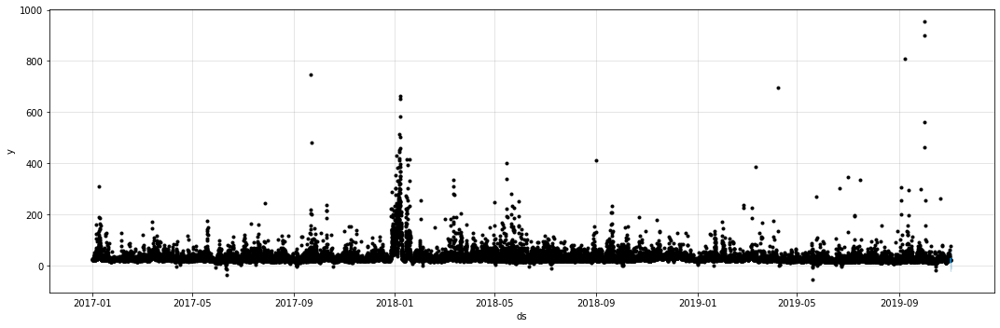

In [27]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = m_base.plot(fcst, ax=ax)

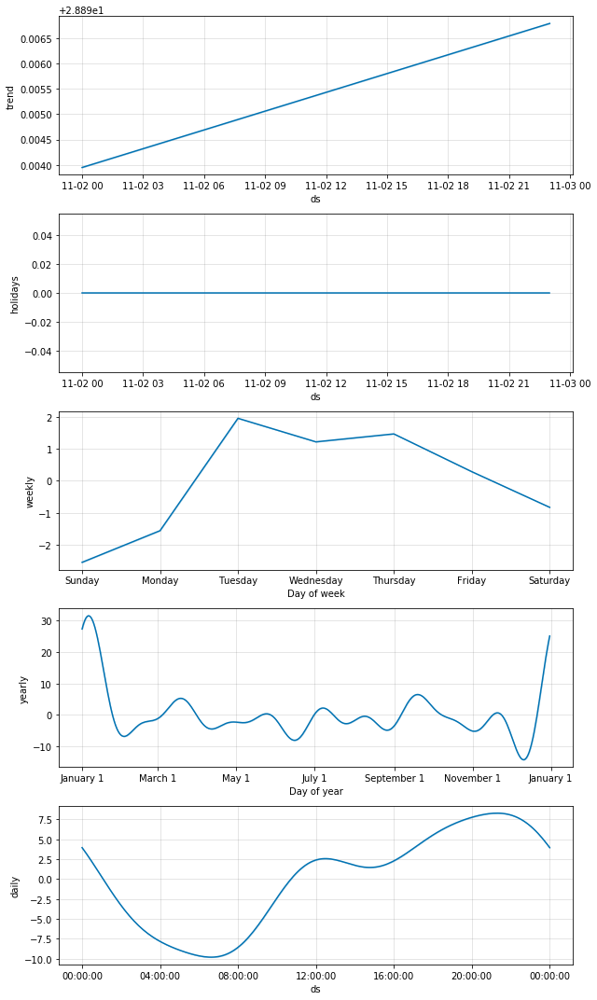

In [28]:
fig = m_base.plot_components(fcst)

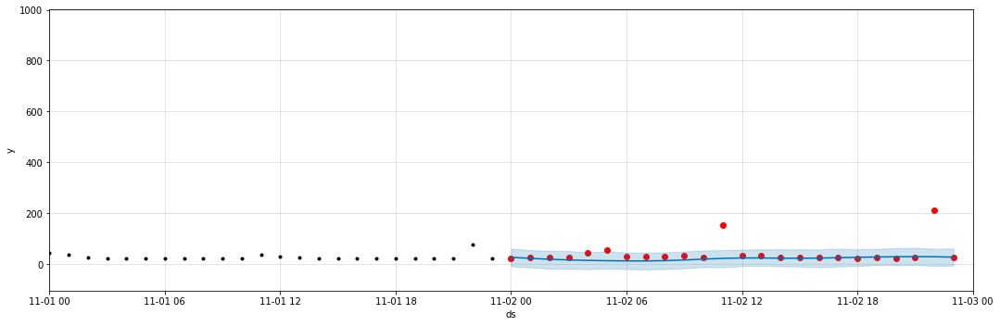

In [29]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(df_test['ds'], df_test['y'], color='r')
fig = m_base.plot(fcst, ax=ax)
ax.set_xbound(lower=datetime(2019, 11, 1), upper=datetime(2019, 11, 3))
# ax.set_ylim(0, 60000)
# plot = plt.suptitle('January 2015 Forecast vs Actuals')

In [ ]:
#Baseline

In [102]:
mean_squared_error(y_true=df_test['y'],
                   y_pred=fcst['yhat'])

2261.0990006787547

In [103]:
mean_absolute_error(y_true=df_test['y'],
                   y_pred=fcst['yhat'])

21.813243893164508

In [104]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mean_absolute_percentage_error(y_true=df_test['y'],
                   y_pred=fcst['yhat'])

33.40311575867519

In [ ]:
# with regressors

In [102]:
df = data[['datetime_beginning_utc', 'total_lmp_rt', 'system_energy_price_da',
           'congestion_price_da', 'marginal_loss_price_da',
           'pepco_mw', 'HDD', 'CDD', 'bcpep_spread_mw',
           'forced_outages_mw']].copy()
df.rename(columns={'datetime_beginning_utc': 'ds', 'total_lmp_rt': 'y'}, inplace=True)

In [103]:
holidays = pd.DataFrame(columns=['ds', 'holiday'])
m_rt = Prophet(holidays=holidays)
m_rt.add_regressor('system_energy_price_da')
m_rt.add_regressor('congestion_price_da')
m_rt.add_regressor('marginal_loss_price_da')
m_rt.add_regressor('pepco_mw')
m_rt.add_regressor('HDD')
m_rt.add_regressor('CDD')
m_rt.add_regressor('bcpep_spread_mw')
m_rt.add_regressor('forced_outages_mw')
m_rt.add_country_holidays(country_name='US')

In [104]:
rt_df = df.copy()

In [105]:
# 7-day prediction size (24 * 7 = 168)
prediction_size = 168
train_df_rt = rt_df[:-prediction_size]

In [106]:
m_rt.fit(train_df_rt);

In [107]:
future_rt = rt_df.drop(columns=['y'])

In [108]:
forecast_rt = m_rt.predict(future_rt)

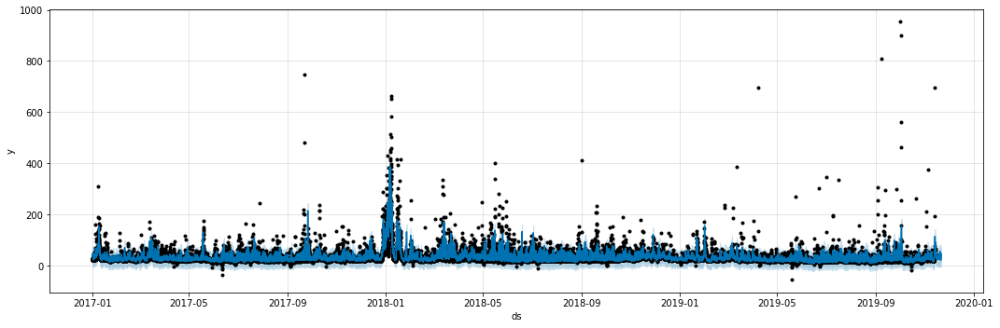

In [109]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = m_rt.plot(forecast_rt, ax=ax)

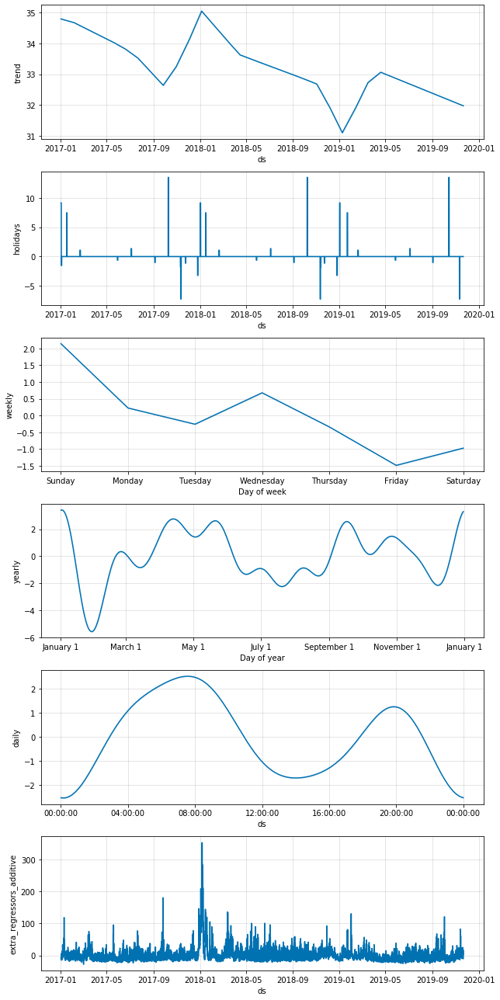

In [110]:
fig = m_rt.plot_components(forecast_rt)

In [111]:
compare_df_rt = forecast_rt.set_index('ds')[['yhat', 'yhat_lower', 'yhat_upper']].join(rt_df.set_index('ds'))

In [112]:
mean_squared_error(y_true=compare_df_rt['y'],
                   y_pred=compare_df_rt['yhat'])

486.30842966675726

In [113]:
mean_absolute_error(y_true=compare_df_rt['y'],
                   y_pred=compare_df_rt['yhat'])

7.6801146388452235

In [114]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mean_absolute_percentage_error(y_true=compare_df_rt['y'],
                   y_pred=compare_df_rt['yhat'])

21.194584712635645

In [ ]:
# transform & rt

In [82]:
df_rt = data[['datetime_beginning_ept', 'total_lmp_rt', 'system_energy_price_da',
           'congestion_price_da', 'marginal_loss_price_da',
           'pepco_mw', 'HDD', 'CDD', 'bcpep_spread_mw',
           'forced_outages_mw']].copy()
df_rt.rename(columns={'datetime_beginning_ept': 'ds', 'total_lmp_rt': 'y'}, inplace=True)

In [83]:
holidays = pd.DataFrame(columns=['ds', 'holiday'])
m_rt_box = Prophet(holidays=holidays)
m_rt_box.add_regressor('system_energy_price_da')
m_rt_box.add_regressor('congestion_price_da')
m_rt_box.add_regressor('marginal_loss_price_da')
m_rt_box.add_regressor('pepco_mw')
m_rt_box.add_regressor('HDD')
m_rt_box.add_regressor('CDD')
m_rt_box.add_regressor('bcpep_spread_mw')
m_rt_box.add_regressor('forced_outages_mw')
m_rt_box.add_country_holidays(country_name='US')

In [84]:
df_rt_box = df_rt.copy()

In [85]:
yj = PowerTransformer(method='yeo-johnson')

In [86]:
pre_y = np.array(df_rt_box['y']).reshape(-1, 1)
transformed_y = yj.fit_transform(pre_y)

In [87]:
df_rt_box['y'] = transformed_y

In [88]:
test = df_rt_box['y'].copy()
test_pre = yj.inverse_transform(np.array(test).reshape(-1, 1))

In [89]:
# 7-day prediction size (24 * 7 = 168)
prediction_size = 168
train_df_rt_box = df_rt_box[:-prediction_size]

In [90]:
m_rt_box.fit(train_df_rt_box);

In [91]:
future_rt_box = df_rt_box.drop(columns=['y'])

In [93]:
forecast_rt_box = m_rt_box.predict(future_rt_box)

In [94]:
for column in ['yhat', 'yhat_lower', 'yhat_upper']:
        forecast_rt_box[column] = yj.inverse_transform(np.array(forecast_rt_box[column]).reshape(-1, 1))
m_rt_box.history['y'] = yj.inverse_transform(np.array(m_rt_box.history['y']).reshape(-1, 1))

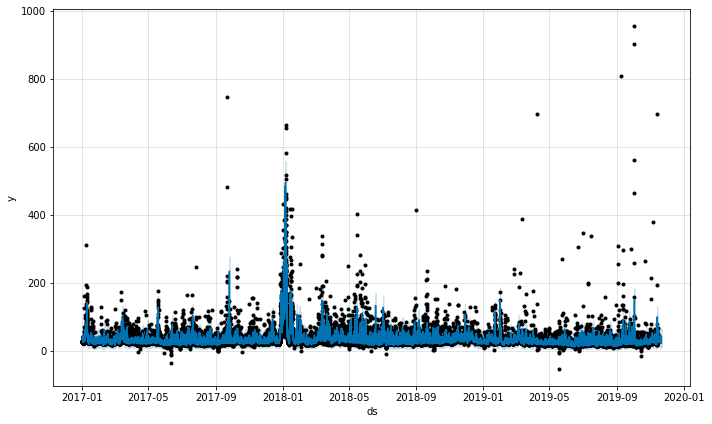

In [95]:
m_rt_box.plot(forecast_rt_box);

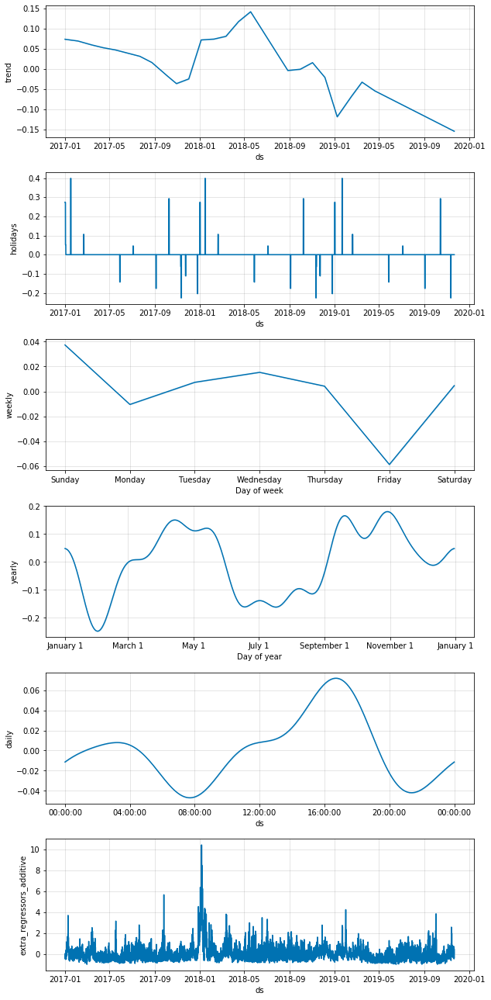

In [96]:
m_rt_box.plot_components(forecast_rt_box);

In [97]:
compare_df_rt_box = forecast_rt_box.set_index('ds')[['yhat', 'yhat_lower', 'yhat_upper']].join(df_rt.set_index('ds'))

In [98]:
mean_squared_error(y_true=compare_df_rt_box['y'],
                   y_pred=compare_df_rt_box['yhat'])

497.6157797946192

In [99]:
mean_absolute_error(y_true=compare_df_rt_box['y'],
                   y_pred=compare_df_rt_box['yhat'])

7.078758526418025

In [100]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mean_absolute_percentage_error(y_true=compare_df_rt_box['y'],
                   y_pred=compare_df_rt_box['yhat'])

18.453362499736446

In [ ]:
# pepco MW with regressors

In [182]:
df_mw = data[['datetime_beginning_ept', 'pepco_mw', 
              'HDD', 'CDD', 'dewPoint', 'sunniness',
              'total_outages_mw']].copy()
df_mw.rename(columns={'datetime_beginning_ept': 'ds', 'pepco_mw': 'y'}, inplace=True)

In [149]:
df_mw_train = df_mw.loc[df['ds'] < datetime(2019, 6, 1)]
df_mw_test = df_mw.loc[(df['ds'] >= datetime(2019, 6, 1)) & (df_mw['ds'] < datetime(2019, 6, 8))]

In [150]:
holidays = pd.DataFrame(columns=['ds', 'holiday'])
m = Prophet(holidays=holidays)
m.add_regressor('HDD')
m.add_regressor('CDD')
m.add_regressor('dewPoint')
m.add_regressor('sunniness')
m.add_regressor('total_outages_mw')
m.add_country_holidays(country_name='US')

In [151]:
m.fit(df_mw_train)

In [152]:
fcst = m.predict(df_mw_test.reset_index())

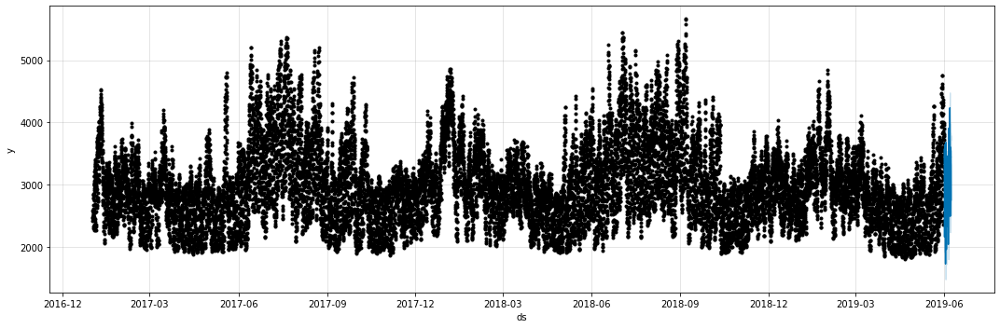

In [153]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = m.plot(fcst, ax=ax)

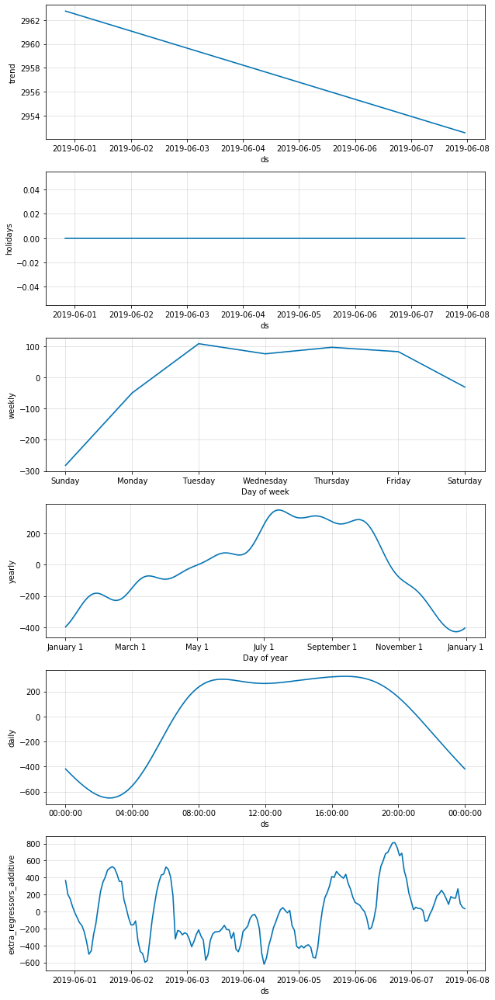

In [154]:
fig = m.plot_components(fcst)

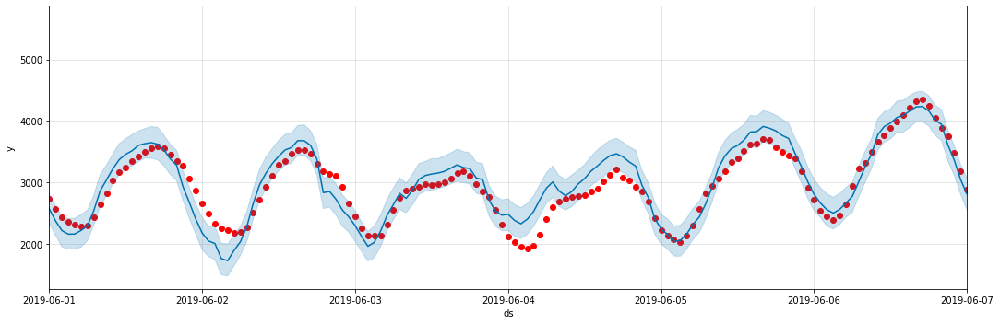

In [158]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(df_mw_test['ds'], df_mw_test['y'], color='r')
fig = m.plot(fcst, ax=ax)
ax.set_xbound(lower=datetime(2019, 6, 1), upper=datetime(2019, 6, 7))
# ax.set_ylim(0, 60000)
# plot = plt.suptitle('January 2015 Forecast vs Actuals')

In [159]:
mean_squared_error(y_true=df_mw_test['y'],
                   y_pred=fcst['yhat'])

42821.055760666255

In [160]:
mean_absolute_error(y_true=df_mw_test['y'],
                   y_pred=fcst['yhat'])

166.9821650207803

In [161]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mean_absolute_percentage_error(y_true=df_mw_test['y'],
                   y_pred=fcst['yhat'])

5.969288694428922

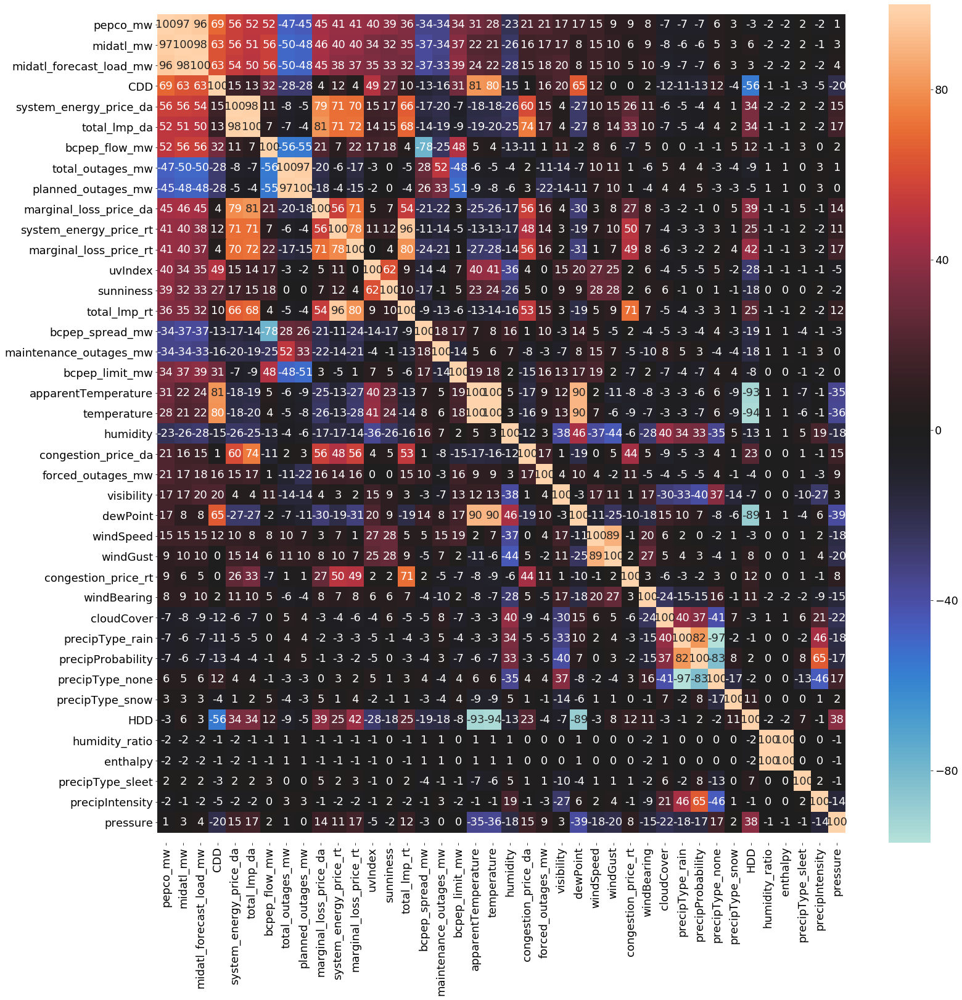

In [204]:
# observing data correlations
#removing time columns
corr_data = data.drop(columns=['datetime_beginning_utc', 'datetime_beginning_ept'])

# creating the sort order
sorted_corr_series = corr_data.corr().pepco_mw.abs().sort_values(ascending=False)
sorted_cols = list(sorted_corr_series.index)

# to allow for larger font sizes,
# the correlations are being rounded and multiplied by 100
sorted_corr_df = corr_data[sorted_cols].corr().round(2)*100

plt.rcParams.update({'font.size': 18})
fig, ax = plt.subplots(figsize = (25, 25))

sns.heatmap(sorted_corr_df.astype(int),
           center = 0, annot = True, fmt="d")

# a bug in the current version of matplotlib shifts the default ylim,
# and the code below corrects it
ax.set_ylim(len(corr_data.columns)+0.5, -0.5);

In [218]:
plt.rcParams.update({'font.size': 10})

In [13]:
df_mw = data[['datetime_beginning_ept', 'pepco_mw', 
              'HDD', 'CDD', 'dewPoint', 'sunniness',
              'total_outages_mw', 'visibility',
              'apparentTemperature']].copy()
df_mw.rename(columns={'datetime_beginning_ept': 'ds', 'pepco_mw': 'y'}, inplace=True)

In [206]:
# 7-day prediction size (24 * 7 = 168)
prediction_size = 168
train_df = df_mw[:-prediction_size]

In [207]:
holidays = pd.DataFrame(columns=['ds', 'holiday'])
m = Prophet(holidays=holidays)
m.add_regressor('HDD')
m.add_regressor('CDD')
m.add_regressor('dewPoint')
m.add_regressor('sunniness')
m.add_regressor('total_outages_mw')
m.add_regressor('visibility')
m.add_regressor('apparentTemperature')
m.add_country_holidays(country_name='US')

In [208]:
m.fit(train_df)

In [209]:
# future = m.make_future_dataframe(periods=prediction_size)
# future = future.loc[future['ds'] < datetime(2019, 11, 14)]
# future.tail(20)

In [210]:
future = df_mw.drop(columns=['y'])

In [211]:
forecast = m.predict(future)

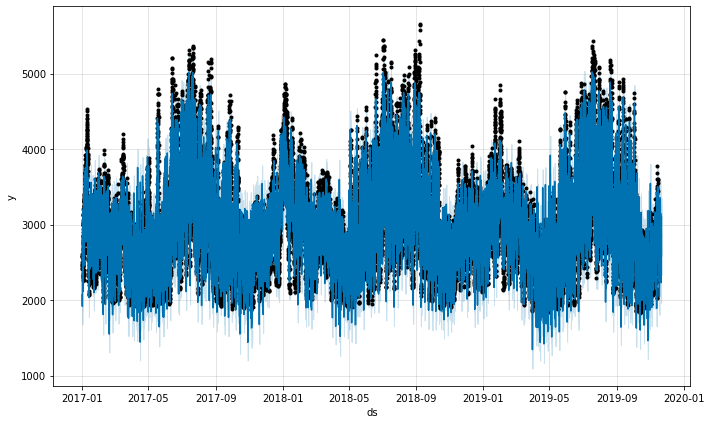

In [219]:
m.plot(forecast);

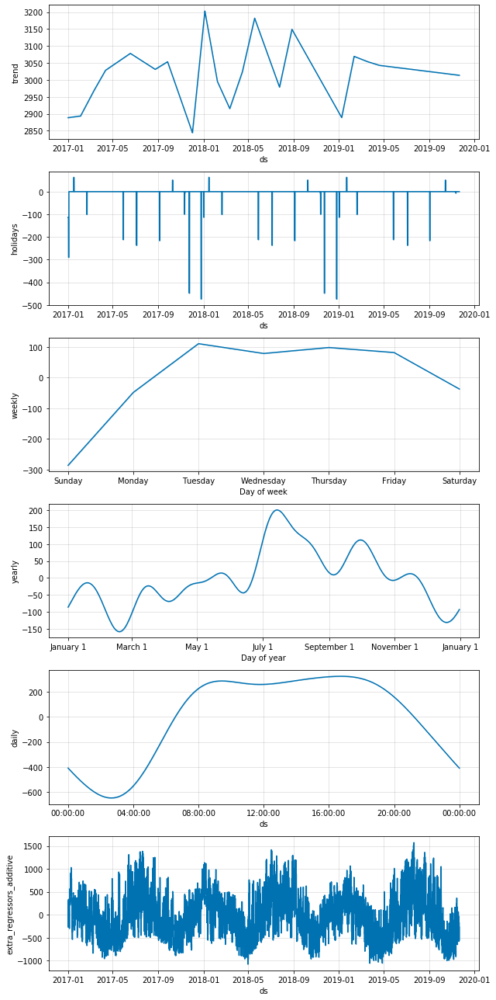

In [220]:
m.plot_components(forecast);

In [214]:
compare_df = forecast.set_index('ds')[['yhat', 'yhat_lower', 'yhat_upper']].join(df_mw.set_index('ds'))

In [215]:
mean_squared_error(y_true=compare_df['y'],
                   y_pred=compare_df['yhat'])

37583.991924244336

In [216]:
mean_absolute_error(y_true=compare_df['y'],
                   y_pred=compare_df['yhat'])

151.90439064782623

In [217]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mean_absolute_percentage_error(y_true=compare_df['y'],
                   y_pred=compare_df['yhat'])

5.251971062017102

In [ ]:
# adding box cox

In [14]:
def inverse_boxcox(y, lambda_):
    return np.exp(y) if lambda_ == 0 else np.exp(np.log(lambda_ * y + 1) / lambda_)

In [15]:
df_mw_box = df_mw.copy()

In [16]:
df_mw_box['y'], lambda_prophet = stats.boxcox(df_mw_box['y'])

In [51]:
# 7-day prediction size (24 * 7 = 168)
prediction_size = 168
train_df_box = df_mw_box[:-prediction_size]

In [52]:
holidays = pd.DataFrame(columns=['ds', 'holiday'])
m_box = Prophet(holidays=holidays)
m_box.add_regressor('HDD')
m_box.add_regressor('CDD')
m_box.add_regressor('dewPoint')
m_box.add_regressor('sunniness')
m_box.add_regressor('total_outages_mw')
m_box.add_regressor('visibility')
m_box.add_regressor('apparentTemperature')
m_box.add_country_holidays(country_name='US')

In [53]:
m_box.fit(train_df_box)

In [54]:
future_box = df_mw_box.drop(columns=['y'])

In [55]:
forecast_box = m_box.predict(future_box)

In [57]:
for column in ['yhat', 'yhat_lower', 'yhat_upper']:
        forecast_box[column] = inverse_boxcox(forecast_box[column], lambda_prophet)
m_box.history['y'] = inverse_boxcox(m_box.history['y'], lambda_prophet)

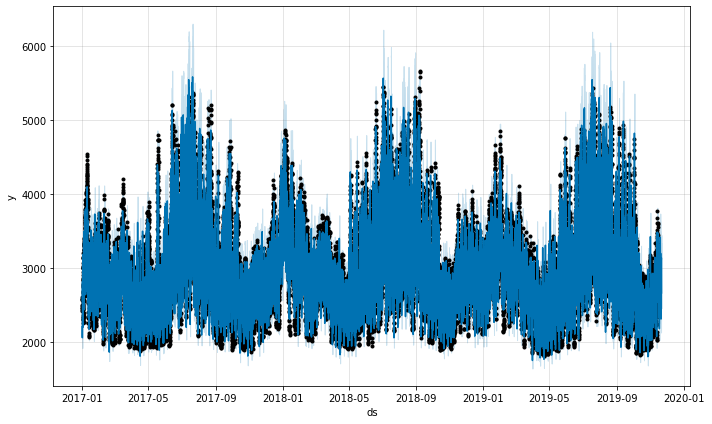

In [58]:
m_box.plot(forecast_box);

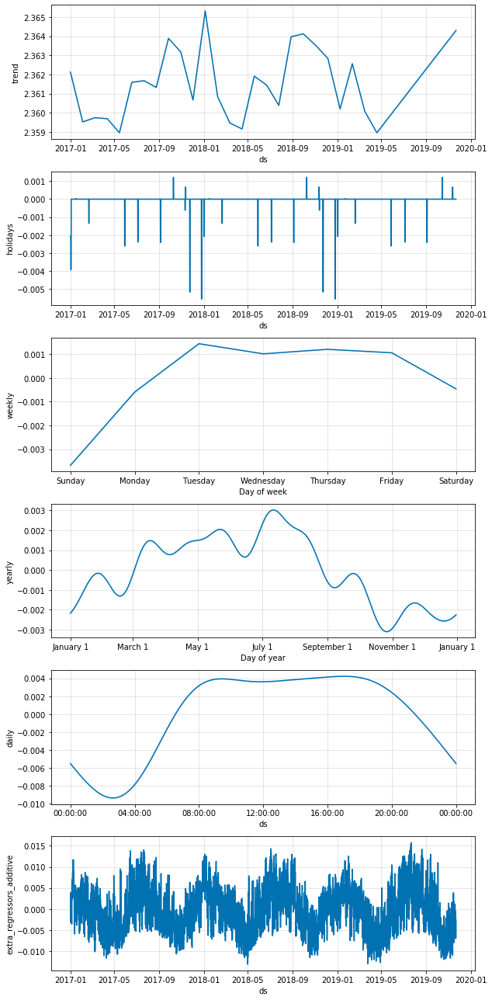

In [59]:
m_box.plot_components(forecast_box);

In [60]:
compare_df_box = forecast_box.set_index('ds')[['yhat', 'yhat_lower', 'yhat_upper']].join(df_mw.set_index('ds'))

In [61]:
mean_squared_error(y_true=compare_df_box['y'],
                   y_pred=compare_df_box['yhat'])

34892.28859985916

In [62]:
mean_absolute_error(y_true=compare_df_box['y'],
                   y_pred=compare_df_box['yhat'])

146.20057182596568

In [63]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mean_absolute_percentage_error(y_true=compare_df_box['y'],
                   y_pred=compare_df_box['yhat'])

4.979183970867707

In [ ]:
# no regressors

In [188]:
# 7-day prediction size (24 * 7 = 168)
prediction_size = 168
train_df = df_mw[:-prediction_size]

In [189]:
holidays = pd.DataFrame(columns=['ds', 'holiday'])
m = Prophet(holidays=holidays)
m.add_country_holidays(country_name='US')

In [190]:
m.fit(train_df)

In [191]:
# future = m.make_future_dataframe(periods=prediction_size)
# future = future.loc[future['ds'] < datetime(2019, 11, 14)]
# future.tail(20)

In [195]:
future = df_mw[['ds']]

In [197]:
forecast = m.predict(future)

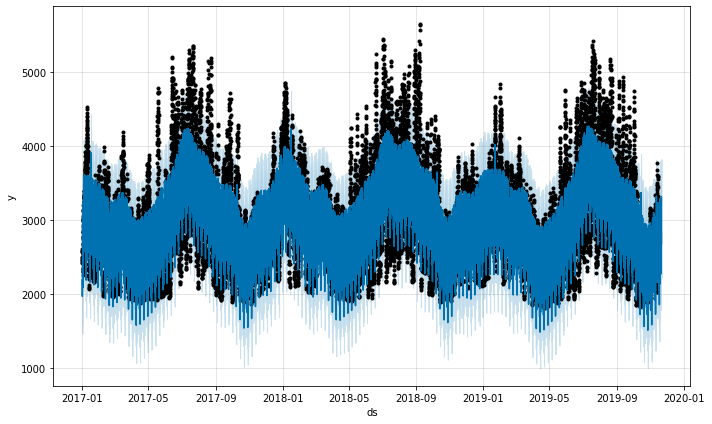

In [198]:
m.plot(forecast);

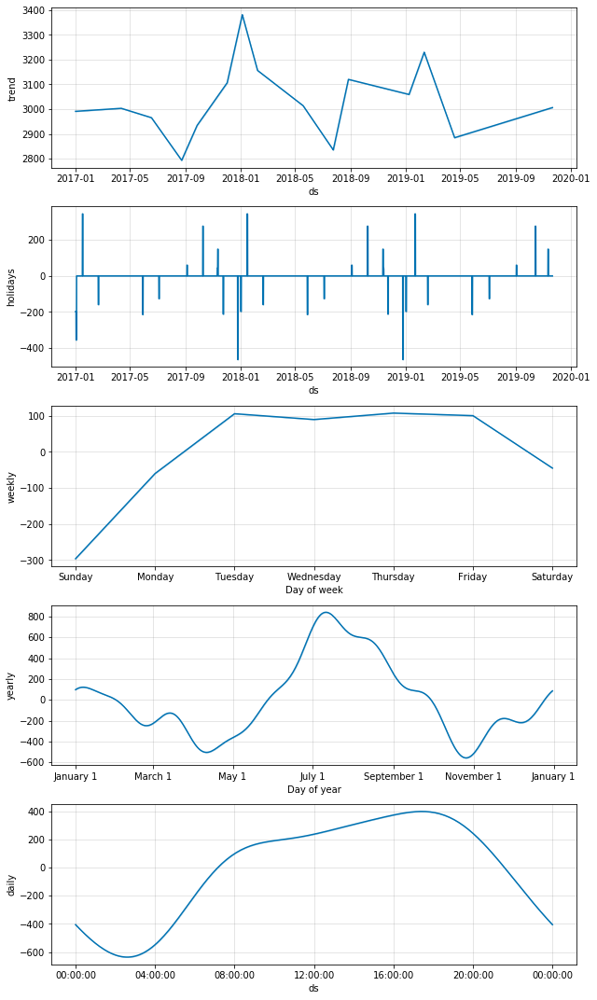

In [199]:
m.plot_components(forecast);

In [200]:
compare_df = forecast.set_index('ds')[['yhat', 'yhat_lower', 'yhat_upper']].join(df_mw.set_index('ds'))

In [201]:
mean_squared_error(y_true=compare_df['y'],
                   y_pred=compare_df['yhat'])

145245.86550269052

In [202]:
mean_absolute_error(y_true=compare_df['y'],
                   y_pred=compare_df['yhat'])

296.09866062773193

In [203]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mean_absolute_percentage_error(y_true=compare_df['y'],
                   y_pred=compare_df['yhat'])

9.739825480020661